In [47]:
import matplotlib.pyplot as plt
import netCDF4 as nc
import numpy as np
import scipy.io
import glob,csv

from pykrige.ok import OrdinaryKriging
from mpl_toolkits.basemap import Basemap
%matplotlib inline

In [48]:
data=scipy.io.loadmat('ANHA4_Pa_diss.mat')
NEMO_dep=data['NEMO_dep']
Pa_diss=data['Pa_diss']
#print Pa_diss.shape
lons=data['lons']
lats=data['lats']
Pa_ini=np.empty([1,50,800,544])

coordinate_name=glob.glob('/ocean/xiaoxiny/research/data/Jasper/ANHA4_IC_T.nc')
coordinate_obj=nc.Dataset(coordinate_name[0])
nav_lon=coordinate_obj.variables['nav_lon'][:]
nav_lat=coordinate_obj.variables['nav_lat'][:]
ANHAdep=coordinate_obj.variables['deptht'][:]
#print ANHAdep
print ANHAdep[43]
nav_lon10=nav_lon[::10,::10]
nav_lat10=nav_lat[::10,::10]

3220.82


In [49]:
masked_name=glob.glob('/ocean/xiaoxiny/research/NEMO-code/NEMOGCM/CONFIG/myANHA/EXP00/ANHA4-EXH001_y2008m01d05_gridT.nc')
masked=nc.Dataset(masked_name[0])
mask=masked.variables['vosaline'][:]
print mask.shape

(1, 50, 800, 544)


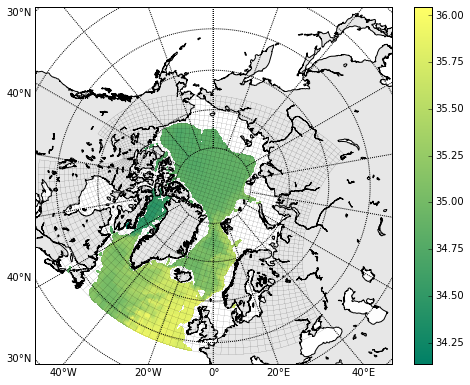

In [57]:
fig=plt.figure(figsize=(8, 8)); ax=plt.gca()
m = Basemap(projection='npstere',boundinglat=latlim,lon_0=0,resolution='l')
m.drawcoastlines()
m.fillcontinents(color = '0.9',alpha=0.95)
m.drawparallels(np.arange(-80.,81.,10.),labels=[1, 0, 0, 0])
m.drawmeridians(np.arange(-180.,181.,20.),labels=[0, 0, 0, 1])
x,y = m(nav_lon, nav_lat)
x10,y10 = m(nav_lon10, nav_lat10)
m.plot(x10[-50:,:],y10[-50:,:],x10[-50:,:].T,y10[-50:,:].T,color='k',linewidth=0.1,)
CS = m.pcolor(x[300:-1,:],y[300:-1,:],mask[0,30,300:-1,:],cmap=plt.cm.summer)
CBar = plt.colorbar(CS, shrink=0.8)

In [46]:
#test getmask()
y = np.array([2,1,5,2])                         # y axis
x = np.array([1,2,3,4])                         # x axis
m = np.ma.masked_where(y<2, y)                  # filter out values larger than 5
new_x = np.ma.masked_where(np.ma.getmask(m), x)
print m
print new_x

[2 -- 5 2]
[1 -- 3 4]


In [7]:
'input boundinglat'
latlim=45
lim=45

In [54]:
what=np.empty([len(ANHAdep),len(Pa_diss[0,:]),len(Pa_diss[0,:])])
            #layer,distance,variance
whatt=np.empty([len(ANHAdep),len(Pa_diss[0,:]),len(Pa_diss[0,:])])
x_all=[]#np.empty([len(ANHAdep),len(Pa_diss[0,:])])
            #layer,x,y
y_all=[]#np.empty([len(ANHAdep),len(Pa_diss[0,:])])
z_all=[]#np.empty([len(ANHAdep),len(Pa_diss[0,:])])
def find(layer):
        x=lons[layer,:]
        y=lats[layer,:]
        z=Pa_diss[layer,:]
        
        x_ma=np.ma.masked_where(z<= 1e-200,x)
        x_ma=np.ma.masked_where(np.isnan(x_ma),x_ma)
        y_ma=np.ma.masked_where(z<= 1e-200,y)
        y_ma=np.ma.masked_where(np.isnan(y_ma),y_ma)
        z_ma=np.ma.masked_where(z<= 1e-200,z)
        z_ma=np.ma.masked_where(np.isnan(y_ma),z_ma)        
        #x_ma=x_ma.compressed()
        #y_ma=y_ma.compressed()
        #z_ma=z_ma.compressed()
        
        
        m = Basemap(projection='npstere',boundinglat=latlim,lon_0=0,resolution='l')
        x_dis,y_dis = m(x_ma, y_ma)
        x_lon,y_lat = m(nav_lon, nav_lat)
        a,b=m(0,90)
        
        xx_lon=np.empty([800,544])
        yy_lat=np.empty([800,544])
        xx_dis=np.empty([len(x_dis)])
        yy_dis=np.empty([len(x_dis)])

        for j in range (544):
            for i in range (800):
                xx_lon[i,j]=x_lon[i,j]-a
                yy_lat[i,j]=y_lat[i,j]-b
        
        xx_lon_ma=np.ma.masked_where(nav_lat<45,xx_lon)
        yy_lat_ma=np.ma.masked_where(nav_lat<45,yy_lat)

        xx_dis=np.ma.masked_where(np.isnan(xx_dis),xx_dis)
        yy_dis=np.ma.masked_where(np.isnan(yy_dis),yy_dis)
        z_ma=np.ma.masked_where(np.isnan(yy_dis),z_ma)
        
        for k in range (len(xx_dis)):
            xx_dis[k]=x_dis[k]-a
            yy_dis[k]=y_dis[k]-b        

        xxx_dis=xx_dis.compressed()
        yyy_dis=yy_dis.compressed()
        zzz_ma=z_ma.compressed()
        
#        woww=[np.empty([len(xxx_dis),len(xxx_dis)])]
#        wow=np.empty([len(xxx_dis),len(xxx_dis)])
#        c=np.average(zzz_ma)
#        for k in range (len(xxx_dis)):
#            for j in range (len(xxx_dis)):
#                woww[k,j]=((xxx_dis[k]-xxx_dis[j])**2+(yyy_dis[k]-yyy_dis[j])**2)**0.5
#                wow[k,j]=0.5*c*(zzz_ma[k]-zzz_ma[j])**2
                
#        what[layer,:,:]=wow[:,:]
#        whatt[layer,:,:]=woww[:,:]
        for applen in range(len(xxx_dis)):
            x_all.append(xxx_dis[applen])
            y_all.append(yyy_dis[applen])
            z_all.append(zzz_ma[applen])
        #print z_all

In [55]:
for i in range (43):#no data below layer 43
    find(i)

Plotting Enabled

Adjusting data for anisotropy...
Initializing variogram model...
Using 'linear' Variogram Model
Slope: 3.44448410666e-09
Nugget: 0.00438125091135 



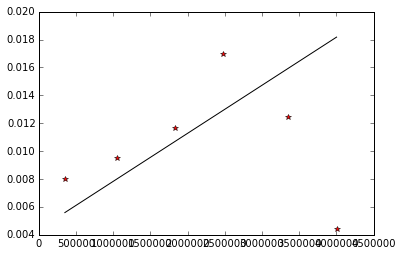

Calculating statistics on variogram model fit...
Q1 = nan
Q2 = nan
cR = nan 

Updating variogram mode...
Using 'linear' Variogram Model
Slope: 4.59480229105e-16
Nugget: 0.0104624572373 



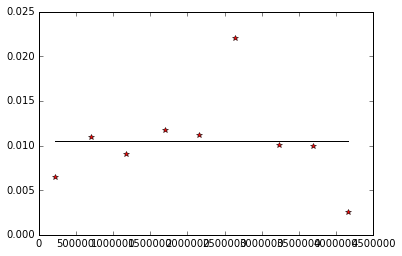

Calculating statistics on variogram model fit...
Q1 = nan
Q2 = nan
cR = nan 



In [56]:
OK = OrdinaryKriging(x_all,y_all, z_all, variogram_model='linear', verbose=True, enable_plotting=True)
OK.update_variogram_model('linear',variogram_parameters=None,nlags=9,anisotropy_angle=0)

In [11]:
'''Input slope and intercept'''
slope=3.44448410666e-09
inter=0.00438125091135 

In [61]:
def write_nc(layer):
        '''a function for  interpolation'''
        x=lons[layer,:]
        y=lats[layer,:]
        z=Pa_diss[layer,:]

        z_ma=np.ma.masked_where(z<= 1e-200,z)
        z_ma=np.ma.masked_where(np.isnan(z_ma),z)
        x_ma=np.ma.masked_where(np.isnan(z_ma),x)
        y_ma=np.ma.masked_where(np.isnan(z_ma),y)

        print ('z_ma %s'%z_ma)
        print ('x_ma %s'%x_ma)
        print ('y_ma %s'%y_ma)
      
        x_ma=x_ma.compressed()
        y_ma=y_ma.compressed()
        z_ma=z_ma.compressed()
        
        m = Basemap(projection='npstere',boundinglat=latlim,lon_0=0,resolution='l')
        x_dis,y_dis = m(x_ma, y_ma)
        x_lon,y_lat = m(nav_lon, nav_lat)
        a,b=m(0,90)
        
        xx_lon=np.empty([800,544])
        yy_lat=np.empty([800,544])
        xx_dis=np.empty([len(x_dis)])
        yy_dis=np.empty([len(x_dis)])

        for j in range (544):
            for i in range (800):
                xx_lon[i,j]=x_lon[i,j]-a
                yy_lat[i,j]=y_lat[i,j]-b
        
        
        for k in range (len(xx_dis)):
            xx_dis[k]=x_dis[k]-a
            yy_dis[k]=y_dis[k]-b        

        xxx_dis=xx_dis#.compressed()
        yyy_dis=yy_dis#.compressed()
        zzz_ma=z_ma#.compressed()
        
        print ('zzz_ma %s'%zzz_ma.shape)
        print ('xxx_dis %s'%xxx_dis.shape)
        print ('yyy_dis %s'%yyy_dis.shape)
        
        OK = OrdinaryKriging(xxx_dis,yyy_dis, zzz_ma, variogram_model='linear', verbose=False, enable_plotting=False)
        OK.update_variogram_model('linear',variogram_parameters=[slope,inter],nlags=7,anisotropy_angle=0)
        
        Pa_interp, ss = OK.execute('points',xx_lon, yy_lat)
        Pa_interp=Pa_interp.reshape(800,544)
        Pa_interp=np.ma.masked_where(np.ma.getmask(mask[0,layer,:,:]),Pa_interp)
        
        fig=plt.figure(figsize=(8, 8)); ax=plt.gca()
        m = Basemap(projection='npstere',boundinglat=latlim,lon_0=0,resolution='l')
        m.drawcoastlines()
        m.fillcontinents(color = '0.9',alpha=0.95)
        m.drawparallels(np.arange(-80.,81.,10.),labels=[1, 0, 0, 0])
        m.drawmeridians(np.arange(-180.,181.,20.),labels=[0, 0, 0, 1])
        x,y = m(nav_lon, nav_lat)
        x10,y10 = m(nav_lon10, nav_lat10)
        m.plot(x10[-50:,:],y10[-50:,:],x10[-50:,:].T,y10[-50:,:].T,color='k',linewidth=0.1,)
        CS = m.pcolor(x[300:-1,:],y[300:-1,:],Pa_interp[300:-1,:],cmap=plt.cm.YlOrBr)
        CBar = plt.colorbar(CS, shrink=0.8)
        #m.scatter(x[0,90],y[0,90],color='yellow',s=100)
        x_mma=x_ma#.compressed()
        y_mma=y_ma#.compressed()
        for j in range(len(x_mma)):
            x2,y2= m(x_mma[j], y_mma[j])
            cmm = plt.cm.get_cmap('YlOrBr')
            m.scatter(x2,y2,c=zzz_ma[j],vmin=np.min(Pa_interp[300:-1,:]),vmax=np.max(Pa_interp[300:-1,:]),cmap=cmm,s=40)
        #fig.savefig('Part. Pa (Layer:%s).pdf'%layer)
        plt.title('Diss. Pa (Layer %s, Depth %.2f m)'%(layer+1,ANHAdep[layer]))
        fig.savefig('/ocean/xiaoxiny/research/writings/Figures/DissPa/Diss. Pa (Layer %s).png'%layer,dpi=100)
        
        Pa_ini[-1,layer,:,:]=Pa_interp
        if layer==43:
            Pa_ini[-1,43:-1,:,:]=Pa_interp
            Pa_ini[-1,-1,:,:]=Pa_interp
            print 'set values of layer 43 for the rest'
        plt.show()

#diss Pa interpolation_result

z_ma [0.163 0.161 0.062 0.14300000000000002 0.073 0.040999999999999995 0.069
 0.313 0.0207 0.015300000000000001 0.018000000000000002 0.0954 0.0477
 0.0312490107 0.018121329900000004 0.0119902572 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -109.0 -51.0 30.0 -137.0 -146.0 -173.0 174.0 0.0
 -134.35 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 86.0 58.0 84.0 70.0 73.0 80.0 83.0 90.0 71.08
 71.73 72.45 -- -- --]
zzz_ma 16
xxx_dis 16
yyy_dis 16


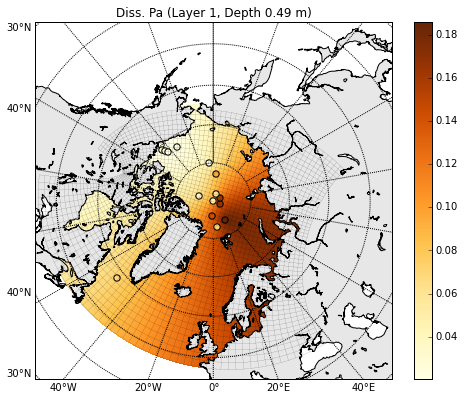

z_ma [0.163 0.161 0.062 0.14300000000000002 0.073 0.0416159563429509 0.069 0.313
 0.0207 0.015300000000000001 0.018000000000000002 0.0954 0.0477
 0.0312490107 0.018121329900000004 0.0119902572 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -109.0 -51.0 30.0 -137.0 -146.0 -173.0 174.0 0.0
 -134.35 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 86.0 58.0 84.0 70.0 73.0 80.0 83.0 90.0 71.08
 71.73 72.45 -- -- --]
zzz_ma 16
xxx_dis 16
yyy_dis 16


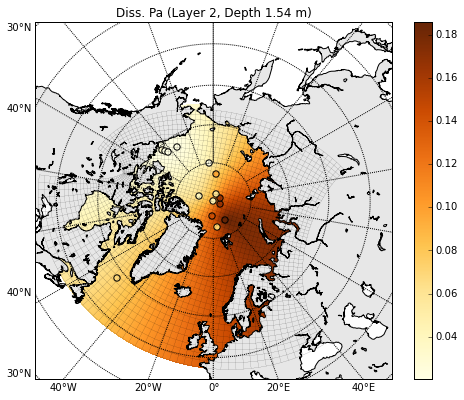

z_ma [0.163 0.161 0.062 0.14300000000000002 0.073 0.0416159563429509 0.069 0.313
 0.0207 0.015300000000000001 0.018000000000000002 0.0954 0.0477
 0.0312490107 0.018121329900000004 0.0119902572 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -109.0 -51.0 30.0 -137.0 -146.0 -173.0 174.0 0.0
 -134.35 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 86.0 58.0 84.0 70.0 73.0 80.0 83.0 90.0 71.08
 71.73 72.45 -- -- --]
zzz_ma 16
xxx_dis 16
yyy_dis 16


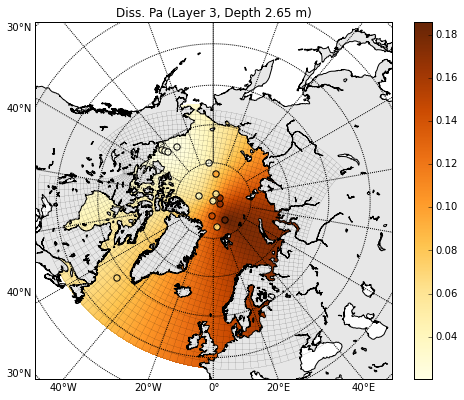

z_ma [0.163 0.161 0.062 0.14300000000000002 0.073 0.042231912685901804 0.069
 0.313 0.0207 0.015300000000000001 0.018000000000000002 0.0954 0.0477
 0.0312490107 0.018121329900000004 0.0119902572 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -109.0 -51.0 30.0 -137.0 -146.0 -173.0 174.0 0.0
 -134.35 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 86.0 58.0 84.0 70.0 73.0 80.0 83.0 90.0 71.08
 71.73 72.45 -- -- --]
zzz_ma 16
xxx_dis 16
yyy_dis 16


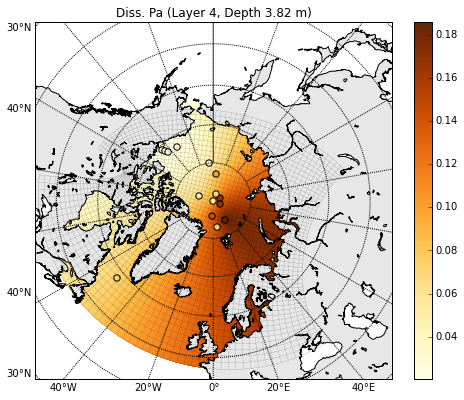

z_ma [0.163 0.161 0.062 0.14300000000000002 0.073 0.04284786902885271 0.069
 0.313 0.0207 0.015300000000000001 0.018000000000000002 0.0954 0.0477
 0.0312490107 0.018121329900000004 0.0119902572 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -109.0 -51.0 30.0 -137.0 -146.0 -173.0 174.0 0.0
 -134.35 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 86.0 58.0 84.0 70.0 73.0 80.0 83.0 90.0 71.08
 71.73 72.45 -- -- --]
zzz_ma 16
xxx_dis 16
yyy_dis 16


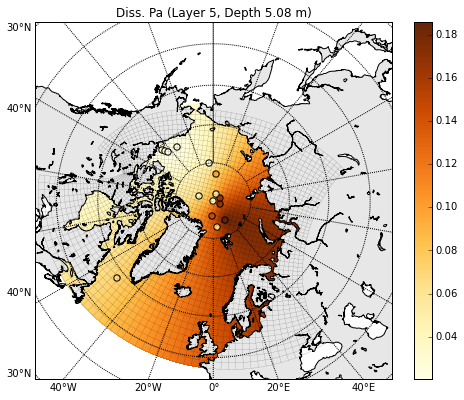

z_ma [0.163 0.161 0.062 0.14300000000000002 0.073 0.04284786902885271 0.069
 0.313 0.0207 0.015300000000000001 0.018000000000000002 0.0954 0.0477
 0.0312490107 0.018121329900000004 0.0119902572 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -109.0 -51.0 30.0 -137.0 -146.0 -173.0 174.0 0.0
 -134.35 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 86.0 58.0 84.0 70.0 73.0 80.0 83.0 90.0 71.08
 71.73 72.45 -- -- --]
zzz_ma 16
xxx_dis 16
yyy_dis 16


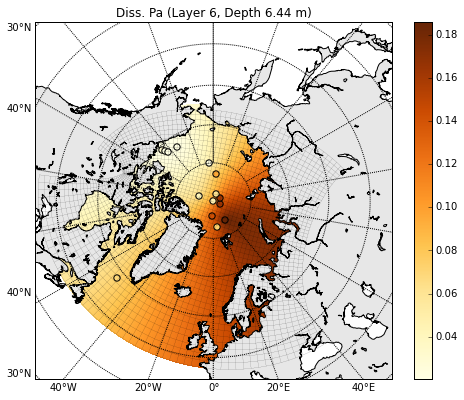

z_ma [0.163 0.161 0.062 0.14300000000000002 0.073 0.04346382537180362 0.069
 0.313 0.0207 0.015300000000000001 0.018000000000000002 0.0954 0.0477
 0.0312490107 0.018121329900000004 0.0119902572 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -109.0 -51.0 30.0 -137.0 -146.0 -173.0 174.0 0.0
 -134.35 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 86.0 58.0 84.0 70.0 73.0 80.0 83.0 90.0 71.08
 71.73 72.45 -- -- --]
zzz_ma 16
xxx_dis 16
yyy_dis 16


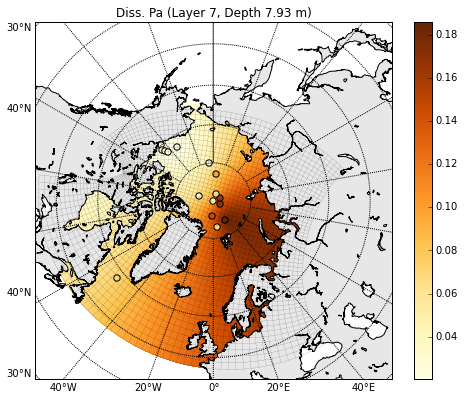

z_ma [0.163 0.161 0.062 0.14300000000000002 0.073 0.044079781714754525 0.069
 0.313 0.0207 0.015300000000000001 0.018000000000000002 0.0954 0.0477
 0.0312490107 0.018121329900000004 0.0119902572 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -109.0 -51.0 30.0 -137.0 -146.0 -173.0 174.0 0.0
 -134.35 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 86.0 58.0 84.0 70.0 73.0 80.0 83.0 90.0 71.08
 71.73 72.45 -- -- --]
zzz_ma 16
xxx_dis 16
yyy_dis 16


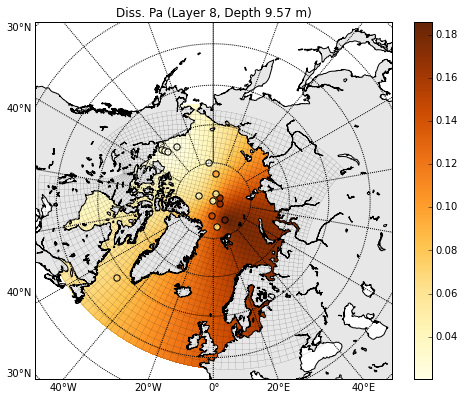

z_ma [0.163 0.161 0.062 0.14300000000000002 0.073 0.04469573805770543 0.069
 0.313 0.0207 0.015300000000000001 0.018000000000000002 0.0954 0.0477
 0.0312490107 0.018121329900000004 0.0119902572 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -109.0 -51.0 30.0 -137.0 -146.0 -173.0 174.0 0.0
 -134.35 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 86.0 58.0 84.0 70.0 73.0 80.0 83.0 90.0 71.08
 71.73 72.45 -- -- --]
zzz_ma 16
xxx_dis 16
yyy_dis 16


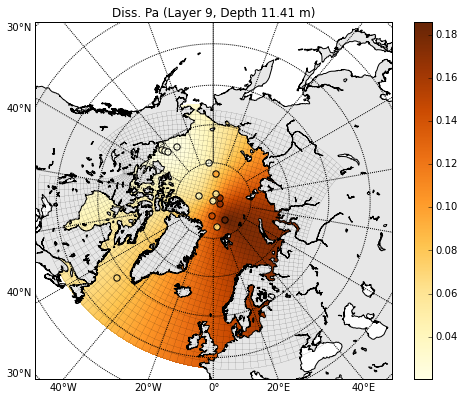

z_ma [0.163 0.161 0.062 0.14300000000000002 0.073 0.045311694400656334 0.069
 0.313 0.0207 0.015300000000000001 0.018260415958460993 0.0954 0.0477
 0.0312490107 0.018121329900000004 0.0119902572 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -109.0 -51.0 30.0 -137.0 -146.0 -173.0 174.0 0.0
 -134.35 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 86.0 58.0 84.0 70.0 73.0 80.0 83.0 90.0 71.08
 71.73 72.45 -- -- --]
zzz_ma 16
xxx_dis 16
yyy_dis 16


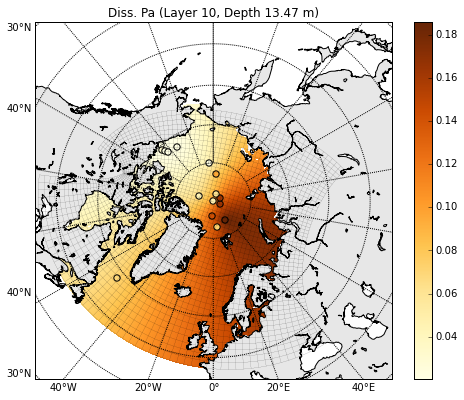

In [62]:
for i in range(0,10,1):
    write_nc(i)

z_ma [0.163 0.161 0.062 0.14300000000000002 0.073 0.04592765074360724 0.069
 0.313 0.0207 0.015300000000000001 0.018623573972647574 0.0954 0.0477
 0.0312490107 0.018121329900000004 0.0119902572 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -109.0 -51.0 30.0 -137.0 -146.0 -173.0 174.0 0.0
 -134.35 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 86.0 58.0 84.0 70.0 73.0 80.0 83.0 90.0 71.08
 71.73 72.45 -- -- --]
zzz_ma 16
xxx_dis 16
yyy_dis 16


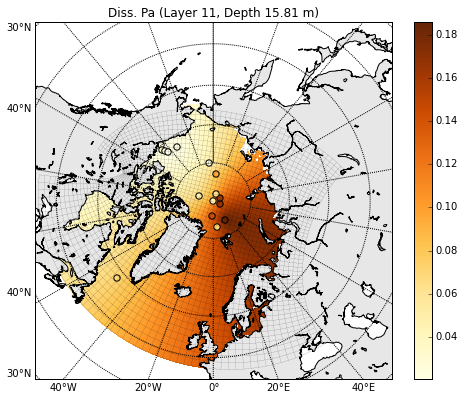

z_ma [0.163 0.161 0.062 0.14300000000000002 0.073 0.047159563429509055 0.069
 0.313 0.0207 0.015300000000000001 0.019349890001020737 0.0954 0.0477
 0.0312490107 0.018121329900000004 0.0119902572 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -109.0 -51.0 30.0 -137.0 -146.0 -173.0 174.0 0.0
 -134.35 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 86.0 58.0 84.0 70.0 73.0 80.0 83.0 90.0 71.08
 71.73 72.45 -- -- --]
zzz_ma 16
xxx_dis 16
yyy_dis 16


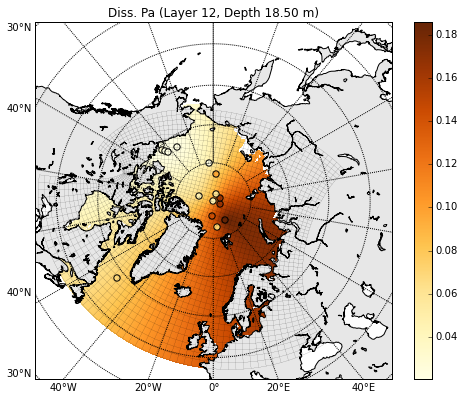

z_ma [0.163 0.161 0.062 0.14300000000000002 0.073 0.04777551977245996 0.069
 0.313 0.0207 0.015300000000000001 0.019713048015207315 0.0954 0.0477
 0.0312490107 0.018121329900000004 0.0119902572 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -109.0 -51.0 30.0 -137.0 -146.0 -173.0 174.0 0.0
 -134.35 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 86.0 58.0 84.0 70.0 73.0 80.0 83.0 90.0 71.08
 71.73 72.45 -- -- --]
zzz_ma 16
xxx_dis 16
yyy_dis 16


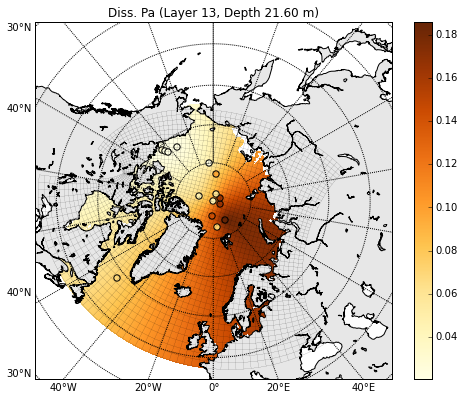

z_ma [0.163 0.161 0.062 0.14300000000000002 0.073 0.04900743245836177 0.069
 0.313 0.0207 0.015300000000000001 0.020439364043580478 0.07630257645289315
 0.0477 0.0312490107 0.018121329900000004 0.0119902572 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -109.0 -51.0 30.0 -137.0 -146.0 -173.0 174.0 0.0
 -134.35 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 86.0 58.0 84.0 70.0 73.0 80.0 83.0 90.0 71.08
 71.73 72.45 -- -- --]
zzz_ma 16
xxx_dis 16
yyy_dis 16


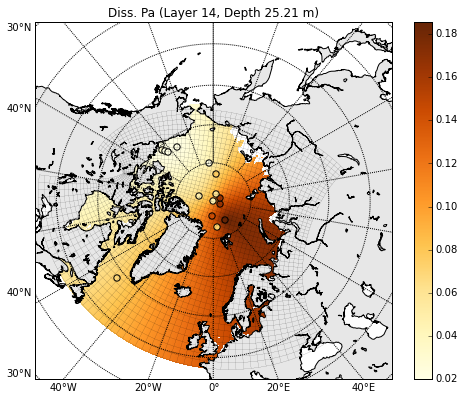

z_ma [0.163 0.161 0.062 0.14300000000000002 0.073 0.05023934514426358 0.069
 0.313 0.0207 0.015300000000000001 0.021165680071953637
 0.050518357445645944 0.0477 0.0312490107 0.018121329900000004 0.0119902572
 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -109.0 -51.0 30.0 -137.0 -146.0 -173.0 174.0 0.0
 -134.35 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 86.0 58.0 84.0 70.0 73.0 80.0 83.0 90.0 71.08
 71.73 72.45 -- -- --]
zzz_ma 16
xxx_dis 16
yyy_dis 16


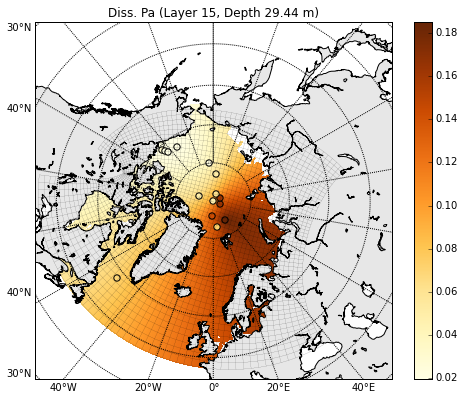

z_ma [0.163 0.161 0.062 0.14300000000000002 0.073 0.05208721417311629
 0.0700634613928229 0.313 0.0207 0.015300000000000001 0.02225515411451338
 0.027416534204487853 0.0477 0.0312490107 0.018121329900000004 0.0119902572
 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -109.0 -51.0 30.0 -137.0 -146.0 -173.0 174.0 0.0
 -134.35 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 86.0 58.0 84.0 70.0 73.0 80.0 83.0 90.0 71.08
 71.73 72.45 -- -- --]
zzz_ma 16
xxx_dis 16
yyy_dis 16


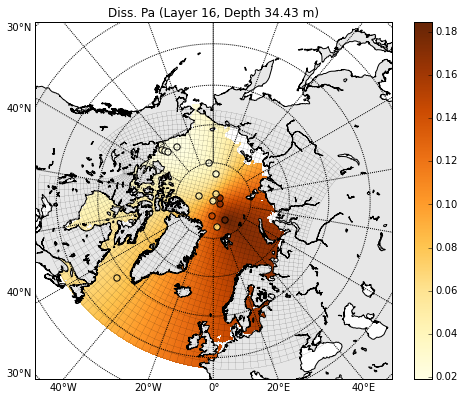

z_ma [0.163 0.161 0.062 0.14300000000000002 0.073 0.05393508320196901
 0.07145499067257911 0.313 -- 0.015300000000000001 0.02334462815707312
 0.02625208560416056 0.0477 0.0312490107 0.018121329900000004 0.0119902572
 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -109.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0
 -134.35 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 86.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 71.08 71.73
 72.45 -- -- --]
zzz_ma 15
xxx_dis 15
yyy_dis 15


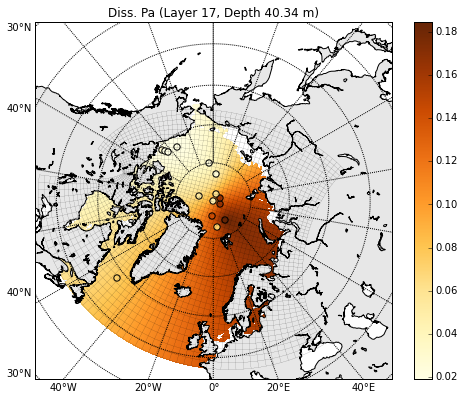

z_ma [0.163 0.161 0.062 0.14300000000000002 0.073 0.05639890857377264
 0.07331036304558737 0.313 -- 0.015300000000000001 0.024797260213819443
 0.024699487470390837 0.0477 0.0312490107 0.018121329900000004 0.0119902572
 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -109.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0
 -134.35 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 86.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 71.08 71.73
 72.45 -- -- --]
zzz_ma 15
xxx_dis 15
yyy_dis 15


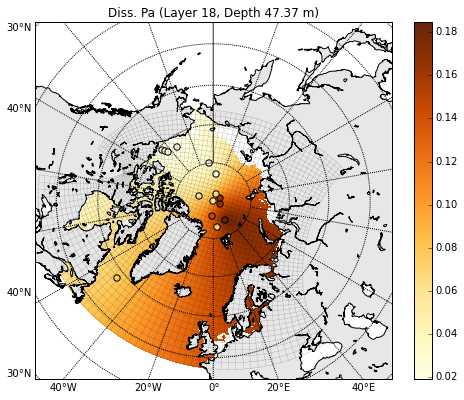

z_ma [0.163 0.161 0.0638440036356158 0.14300000000000002 0.07458570628034865
 0.05886273394557626 0.07516573541859563 0.313 -- 0.015300000000000001
 0.026249892270565765 0.023146889336621113 0.0477 0.03012807255109235
 0.018121329900000004 0.012121975887703841 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -109.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0
 -134.35 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 86.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 71.08 71.73
 72.45 -- -- --]
zzz_ma 15
xxx_dis 15
yyy_dis 15


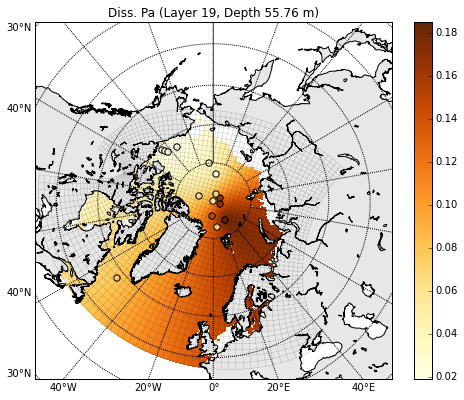

z_ma [0.163 0.161 0.06711212686781011 0.14300000000000002 0.07739604972769941
 0.06194251566033079 0.07748495088485596 0.313 -- 0.015300000000000001
 0.02806568234149867 0.022777355081088232 0.0477 0.028141436551280687
 0.018121329900000004 0.012355420602825193 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -109.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0
 -134.35 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 86.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 71.08 71.73
 72.45 -- -- --]
zzz_ma 15
xxx_dis 15
yyy_dis 15


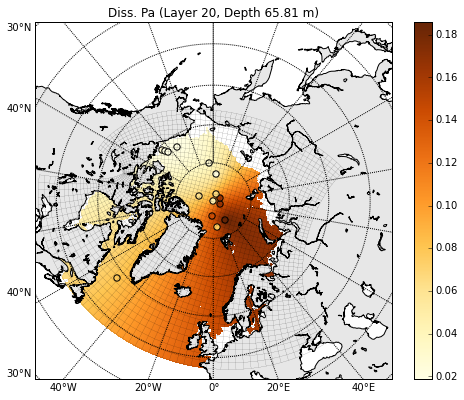

In [63]:
for i in range(10,20,1):
    write_nc(i)

z_ma [0.163 0.161 0.07168749939288212 0.14300000000000002 0.08133053055399046
 0.06625421006098713 0.08073185253762043 0.313 -- 0.015300000000000001
 0.03060778844080473 0.0308993840683711 0.0477 0.02536014615154436
 0.018121329900000004 0.012682243203995086 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -109.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0
 -134.35 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 86.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 71.08 71.73
 72.45 -- -- --]
zzz_ma 15
xxx_dis 15
yyy_dis 15


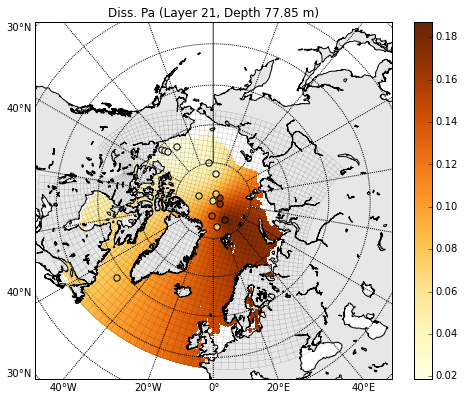

z_ma [0.163 0.161 0.07626287191795414 0.14300000000000002 0.08526501138028152
 0.07056590446164346 0.08397875419038489 0.313 -- 0.015856385337698353
 0.027595249588404466 0.03902141305565397 0.0477 -- 0.018121329900000004
 0.01300906580516498 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -109.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 --
 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 86.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 -- 71.73
 72.45 -- -- --]
zzz_ma 14
xxx_dis 14
yyy_dis 14


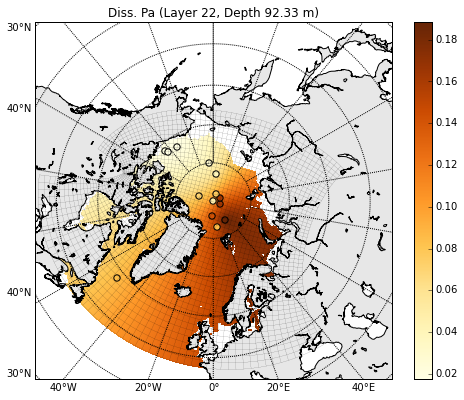

z_ma [0.163 0.161 0.08214549373590387 0.14300000000000002 0.09032362958551288
 0.07610951154820161 0.08636376215282231 0.313 -- 0.016675413470869732
 0.03450523000208063 0.04859178113560831 0.04808751722905488 --
 0.018121329900000004 0.013429266292383413 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -109.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 --
 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 86.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 -- 71.73
 72.45 -- -- --]
zzz_ma 14
xxx_dis 14
yyy_dis 14


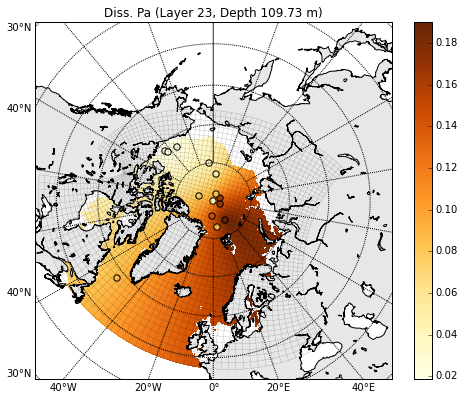

z_ma [0.163 0.161 0.08933536484673132 0.14300000000000002 0.09650638516968454
 0.08288503132066158 0.0872256847635109 0.313 -- 0.01767644785585698
 0.041904179804160266 0.058231371509559565 0.049273164984995683 --
 0.018121329900000004 0.013942844665650388 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -109.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 --
 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 86.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 -- 71.73
 72.45 -- -- --]
zzz_ma 14
xxx_dis 14
yyy_dis 14


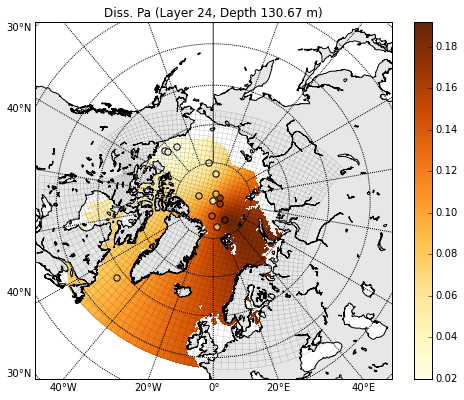

z_ma [0.163 0.161 0.09848610989687535 0.14300000000000002 0.10437534682226665
 0.09150842012197426 0.08832267717711459 0.313 -- 0.01895049161856802
 0.05077234155956293 0.06915877616562291 0.050782171219829426 --
 0.018121329900000004 0.014596489867990173 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -109.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 --
 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 86.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 -- 71.73
 72.45 -- -- --]
zzz_ma 14
xxx_dis 14
yyy_dis 14


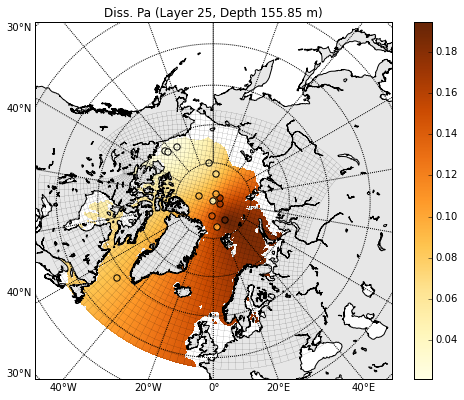

z_ma [0.163 0.161 0.10829047959345825 0.14300000000000002 0.1128063771643189
 0.10074776526623783 0.08949802619168996 0.313 -- 0.020315538507186988
 0.054851201063534236 0.06761172302518809 0.05239896361429416 --
 0.018121329900000004 0.01529682401335423 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -109.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 --
 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 86.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 -- 71.73
 72.45 -- -- --]
zzz_ma 14
xxx_dis 14
yyy_dis 14


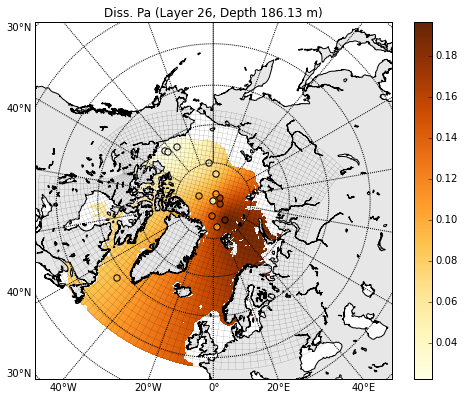

z_ma [0.163 0.161 0.12136297252223543 0.14300000000000002 0.12404775095372193
 0.11306689212525595 0.09106515821112379 0.313 -- 0.022135601025345616
 0.06028968040216265 0.06833434735213151 0.0545546868069138 --
 0.018121329900000004 0.016230602873839636 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -109.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 --
 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 86.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 -- 71.73
 72.45 -- -- --]
zzz_ma 14
xxx_dis 14
yyy_dis 14


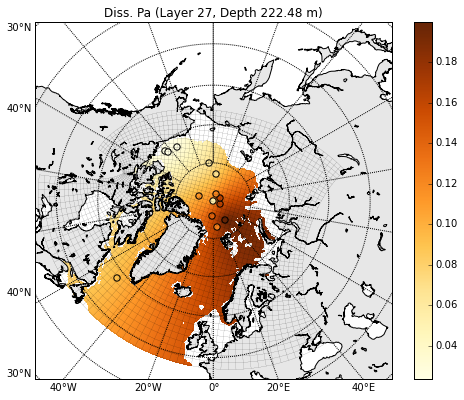

z_ma [0.163 0.161 0.13574271474389032 0.14300000000000002 0.13641326212206523
 0.12661793167017588 0.092789003432501 0.313 -- 0.025294991740866753
 0.0662720076746539 0.07207859037628622 0.0569259823187954 --
 0.018121329900000004 0.017257759620373587 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -109.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 --
 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 86.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 -- 71.73
 72.45 -- -- --]
zzz_ma 14
xxx_dis 14
yyy_dis 14


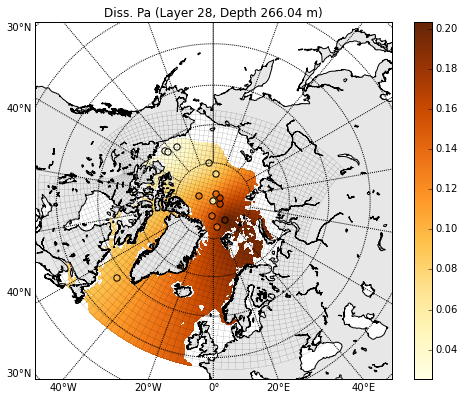

z_ma [0.163 0.161 0.1540442048441784 0.14300000000000002 0.15215118542722947
 0.1438647092728012 0.09498298825970836 0.313 -- 0.03184074547283991
 0.07388587874873367 0.07749773355975632 0.05994399478846289 --
 0.01704146439284303 0.0191425045345555 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -109.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 --
 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 86.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 -- 71.73
 72.45 -- -- --]
zzz_ma 14
xxx_dis 14
yyy_dis 14


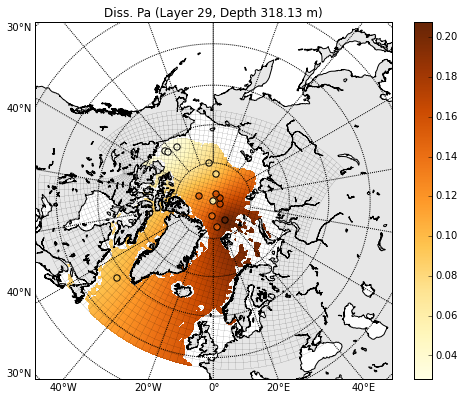

z_ma [0.163 0.161 0.1749601935302219 0.14300000000000002 0.1701373834902743
 0.1635753122472302 0.09749039949080249 0.313 -- 0.039321606880809226
 0.08258744569053914 0.08580598190653599 0.06339315189665432 --
 0.013560546604645288 0.02249795998932063 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -109.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 --
 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 86.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 -- 71.73
 72.45 -- -- --]
zzz_ma 14
xxx_dis 14
yyy_dis 14


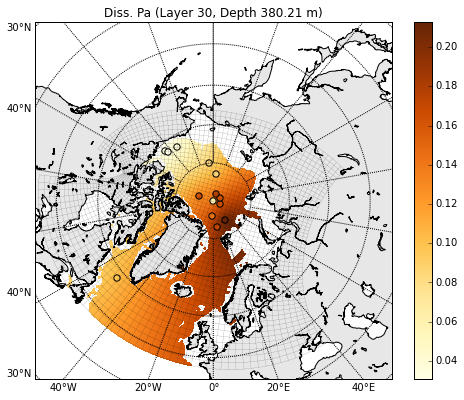

In [64]:
for i in range(20,30,1):
    write_nc(i)

z_ma [0.163 0.161 0.2004515547413374 0.14300000000000002 0.18054718594891875
 0.18636986941610748 0.10054630692869845 0.313 -- 0.04843890672177184
 0.09319248040086454 0.09593165957917368 0.06759681212226261 --
 0.010897688706468654 0.026587421324815626 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -109.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 --
 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 86.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 -- 71.73
 72.45 -- -- --]
zzz_ma 14
xxx_dis 14
yyy_dis 14


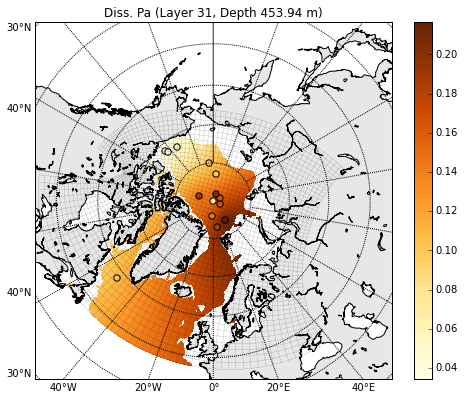

z_ma [0.16553210175486557 0.161 0.21940314475853934 0.14639599529476088
 0.18770946900648744 0.21215408842335468 0.10530281414355165
 0.31360770442116775 -- 0.05782853785335672 0.10079999999999999
 0.10348866115416158 0.0724471893056568 -- 0.03573281665412031
 0.03130603055807909 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -109.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 --
 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 86.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 -- 71.73
 72.45 -- -- --]
zzz_ma 14
xxx_dis 14
yyy_dis 14


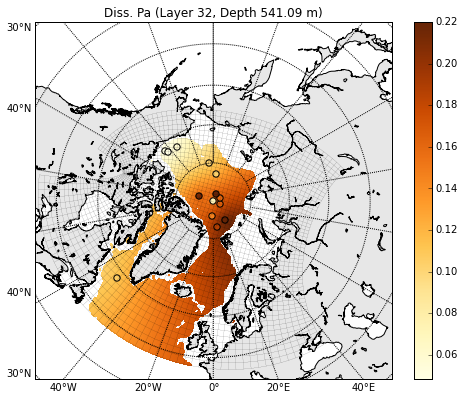

z_ma [0.17197815650667736 0.161 0.2280666423449744 0.15504129225601435
 0.19630420867556983 0.24309515123205133 0.11204637911467785
 0.31515475756160255 -- 0.06757497263809616 0.10079999999999999
 0.10772818177939164 0.07826764192572983 -- 0.03019954199675895
 0.03774257781002659 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -109.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 --
 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 86.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 -- 71.73
 72.45 -- -- --]
zzz_ma 14
xxx_dis 14
yyy_dis 14


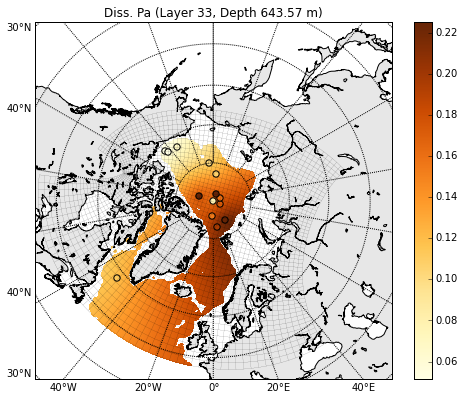

z_ma [0.17949855371712448 0.161 0.23817405619581528 0.1651274720441434
 0.20633140495616595 0.26383861156843946 0.11939135206527177
 0.31695965289210987 -- 0.07894581322029218 0.10079999999999999
 0.1126742891754934 0.08505816998248168 -- 0.03204137342810508
 0.045343378294393576 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -109.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 --
 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 86.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 -- 71.73
 72.45 -- -- --]
zzz_ma 14
xxx_dis 14
yyy_dis 14


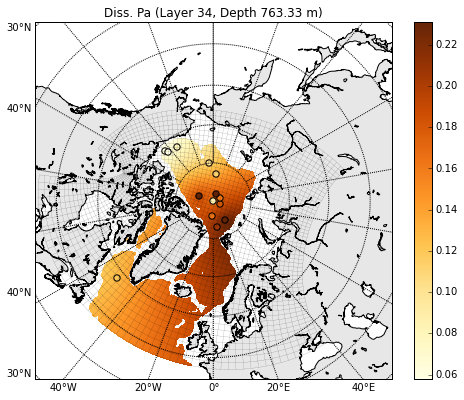

z_ma [0.18809329338620687 0.161 0.24972538631106203 0.17665453465914804
 0.21779105784827582 0.2720895616507586 0.12324179543702067
 0.31902239041268965 -- 0.09189627877456547 0.10079999999999999
 0.11832698334246683 0.09281877347591239 -- 0.03281177954233371
 0.07452147021611387 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -109.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 --
 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 86.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 -- 71.73
 72.45 -- -- --]
zzz_ma 14
xxx_dis 14
yyy_dis 14


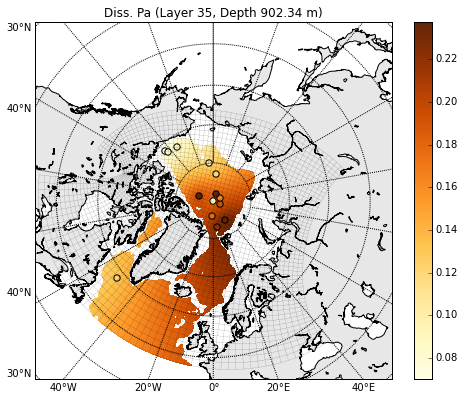

z_ma [0.198120489666803 0.161 0.2784726135787603 0.19010277437665343
 0.2294706808440783 0.2817156700801309 0.1267431340160262
 0.3214289175200327 -- 0.10224434533614069 0.10079999999999999
 0.12606298307005712 0.10187281088491487 -- 0.03596600283802197
 0.08720798810517276 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -109.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 --
 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 86.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 -- 71.73
 72.45 -- -- --]
zzz_ma 14
xxx_dis 14
yyy_dis 14


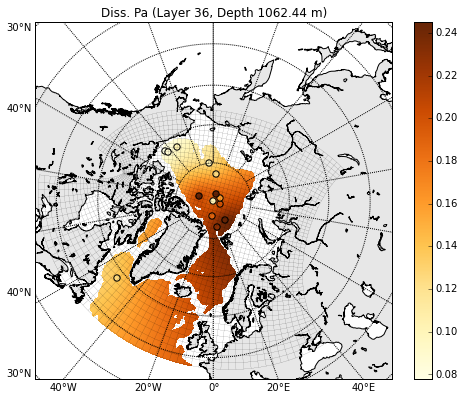

z_ma [0.20958014255891286 0.1634776635323754 0.3390874364057321
 0.20515730019446587 0.23974658937150867 0.29452822809426055
 0.12894338737131128 0.3241792342141391 -- 0.11407070712079809
 0.10079999999999999 0.146873177213052 0.11222028220948913 --
 0.0429301915609685 0.07027684122348507 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -109.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 --
 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 86.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 -- 71.73
 72.45 -- -- --]
zzz_ma 14
xxx_dis 14
yyy_dis 14


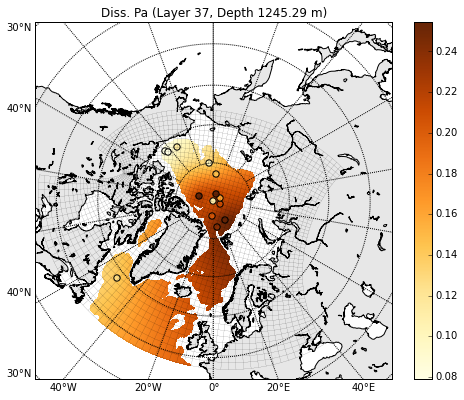

z_ma [0.22103246974903093 0.18369249123405718 0.40727911208607526
 0.2214529266070461 0.2513069864648679 0.3151556033000584
 0.13061244826400467 0.3272733404950087 -- 0.12737536412853764
 0.10079999999999999 0.17586902585695824 0.12386118744963517 --
 0.0606534855897277 0.10674731272319028 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -109.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 --
 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 86.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 -- 71.73
 72.45 -- -- --]
zzz_ma 14
xxx_dis 14
yyy_dis 14


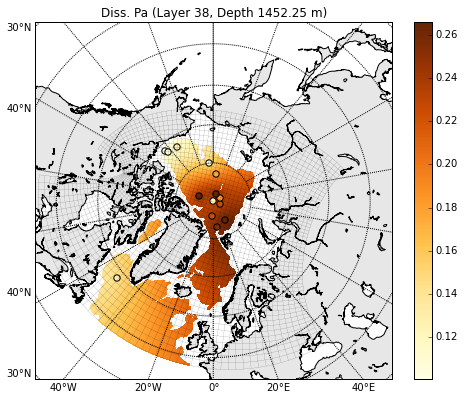

z_ma [0.233382155682428 0.20652775956373481 0.48431044942868523
 0.2398609490360719 0.26436595355181064 0.32 0.12484770082866165
 0.3203711490275404 -- 0.09955691602754306 0.10079999999999999
 0.20862359562137092 0.137011098924615 -- 0.11134610495078283
 0.13097369419185745 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -109.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 --
 -135.3 -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 86.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 -- 71.73
 72.45 -- -- --]
zzz_ma 14
xxx_dis 14
yyy_dis 14


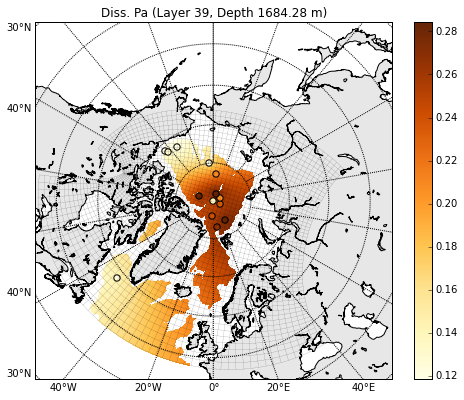

z_ma [0.24704779175626904 0.23179629419083708 0.5475942383647739
 0.2602304820517972 0.2792687815648836 0.32 0.12542893398255148
 0.30971367183787823 -- 0.15942787256237106 0.10079999999999999
 0.24486840642625377 0.15156223047479755 -- -- 0.2153648048017581 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -109.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 --
 -- -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 86.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 -- -- 72.45
 -- -- --]
zzz_ma 13
xxx_dis 13
yyy_dis 13


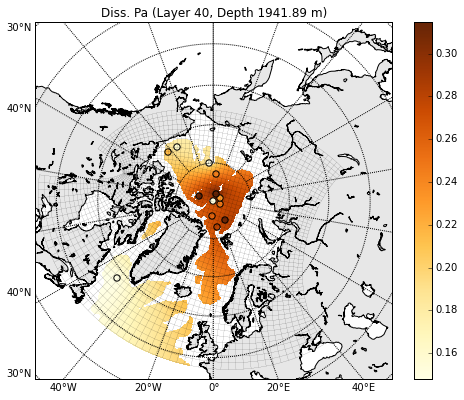

In [65]:
for i in range(30,40,1):
    write_nc(i)

z_ma [0.26202937797055403 0.25945743428962 0.573882682099274 0.27841392615816596
 0.29905578222525997 0.32 0.1255390537191804 0.29802991906698933 --
 0.20480674617759959 0.10079999999999999 0.2718 0.16751458210018288 -- --
 0.23814406801958038 -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -109.0 -51.0 30.0 -- -146.0 -173.0 174.0 0.0 --
 -- -136.93 -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 86.0 58.0 84.0 -- 73.0 80.0 83.0 90.0 -- -- 72.45
 -- -- --]
zzz_ma 13
xxx_dis 13
yyy_dis 13


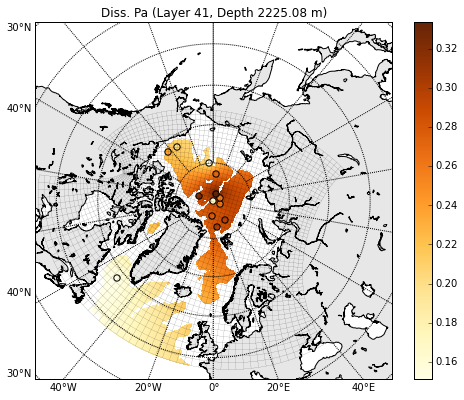

z_ma [0.28832799575900303 0.2871324960240653 0.6024802458915341
 0.2744164172409683 0.3205808302409397 0.32 0.12558649920481307
 0.2581918949558707 -- 0.2754341914119811 -- 0.2718 0.17282772269690228 --
 -- -- -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -109.0 -51.0 30.0 -- -146.0 -- 174.0 0.0 -- --
 -- -- -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 86.0 58.0 84.0 -- 73.0 -- 83.0 90.0 -- -- -- --
 -- --]
zzz_ma 11
xxx_dis 11
yyy_dis 11


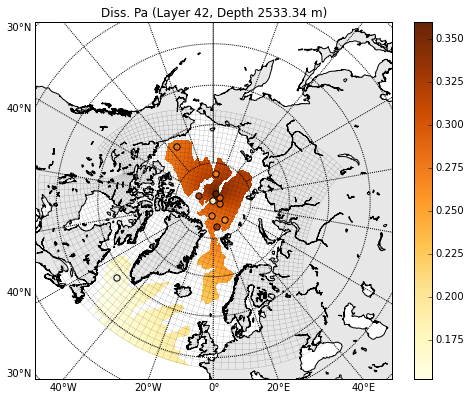

z_ma [0.3202316694106369 0.3170421900724721 0.6318508677697253
 0.27009612810064293 0.3438439256119228 0.32 0.13156843801449442
 0.2125519173708944 -- 0.3400391305565397 -- -- -- -- -- -- -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -109.0 -51.0 30.0 -- -146.0 -- -- -- -- -- -- --
 -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 86.0 58.0 84.0 -- 73.0 -- -- -- -- -- -- -- -- --]
zzz_ma 9
xxx_dis 9
yyy_dis 9


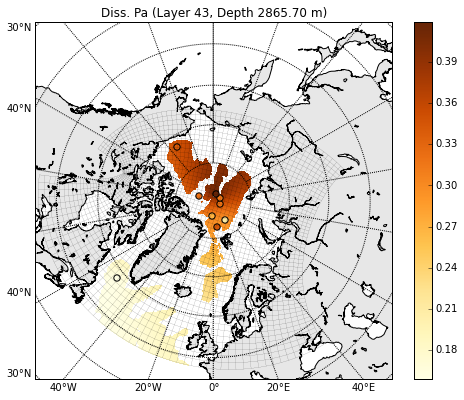

z_ma [0.3543355964175559 0.3489969132090254 0.6282983753731712
 0.2680482855968266 0.38514998290999347 0.32 0.09932441212744744 -- --
 0.3663 -- -- -- -- -- -- -- -- --]
x_ma [60.0 109.0 159.0 -5.0 9.0 -109.0 -51.0 -- -- -146.0 -- -- -- -- -- -- --
 -- --]
y_ma [88.0 88.0 88.0 86.0 83.0 86.0 58.0 -- -- 73.0 -- -- -- -- -- -- -- -- --]
zzz_ma 8
xxx_dis 8
yyy_dis 8
set values of layer 43 for the rest


/home/xiaoxiny/anaconda/lib/python2.7/site-packages/IPython/kernel/__main__.py:7: RuntimeWarning: invalid value encountered in less_equal


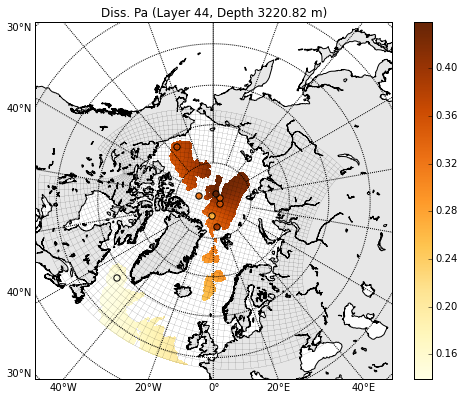

In [66]:
for i in range(40,44,1):
    write_nc(i)

#write the nc file

In [31]:
lat = nav_lat
lon = nav_lon
print lat.shape
xmax = lat.shape[1]
ymax = lat.shape[0]
depthtmax = NEMO_dep.shape[0]
print depthtmax

import os
#os.remove("/ocean/xiaoxiny/research/data/data_ANHA_Pa_diss.nc")
nemo = nc.Dataset('/ocean/xiaoxiny/research/data/data_ANHA_Pa_diss.nc', 'w')
nemo.description = 'Initial diss. Pa value' 

# dimensions
nemo.createDimension('x', xmax)
nemo.createDimension('y', ymax)
nemo.createDimension('deptht',depthtmax)
nemo.createDimension('time_counter', None)

# variables
# latitude and longitude
my_lat = nemo.createVariable('nav_lat','float32',('y','x'),zlib=True)
my_lat[:,:] = lat[:,:] 
x = nemo.createVariable('nav_lon','float32',('y','x'),zlib=True)
x[:,:]  = lon[:,:] 
# time
time_counter = nemo.createVariable('time_counter', 'float32', ('time_counter'),zlib=True)
time_counter.units = 'non-dim'
time_counter[0] = 1
# depth
depth = nemo.createVariable('deptht', 'float32', ('deptht'),zlib=True)
depth.units = 'meter'
depth[:] = ANHAdep[:]

Pa = nemo.createVariable('Pa_diss', 'float32', ('time_counter','deptht','y','x'), zlib=True)
Pa._units = 'arbitrary'
Pa[:,:,:,:]=Pa_ini[:,:,:,:]
nemo.close()

(800, 544)
50


In [ ]:
#test .nc file

In [32]:
import glob,csv
nc_filename=glob.glob('/ocean/xiaoxiny/research/data/data_ANHA_Pa_diss.nc')
print("found *.nc file: \n{}".format(nc_filename))

found *.nc file: 
['/ocean/xiaoxiny/research/data/data_ANHA_Pa_diss.nc']


In [33]:
ptrc=nc.Dataset(nc_filename[0])
print ptrc.variables
lat=ptrc.variables['nav_lat'][:]
dept=ptrc.variables['deptht'][:]
Pa_diss=ptrc.variables['Pa_diss'][:]

OrderedDict([(u'nav_lat', <netCDF4.Variable object at 0x7fd954691d60>), (u'nav_lon', <netCDF4.Variable object at 0x7fd93ef04a68>), (u'time_counter', <netCDF4.Variable object at 0x7fd93ef04050>), (u'deptht', <netCDF4.Variable object at 0x7fd93ef040e8>), (u'Pa_diss', <netCDF4.Variable object at 0x7fd93ef04348>)])


In [34]:
#test input
Pa_diss[0,0,0,0:10]#-Pa_ini[0,0,0,0:10]

array([ 0.0217569 ,  0.02191841,  0.02208115,  0.02224513,  0.02241033,
        0.02257676,  0.02274442,  0.02291329,  0.02308338,  0.02325468], dtype=float32)

In [35]:
dept-ANHAdep

array([ 0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
        0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.], dtype=float32)

In [36]:
lat

array([[-20.07611084, -20.07611084, -20.07611084, ..., -20.07611084,
        -20.07611084, -20.07611084],
       [-19.8411274 , -19.8411274 , -19.8411274 , ..., -19.8411274 ,
        -19.8411274 , -19.8411274 ],
       [-19.605793  , -19.605793  , -19.605793  , ..., -19.605793  ,
        -19.605793  , -19.605793  ],
       ..., 
       [ 56.78784561,  56.80397415,  56.82052612, ...,  54.60116577,
         54.53417206,  54.46720886],
       [ 56.71054459,  56.72655106,  56.74296951, ...,  54.52142715,
         54.45484543,  54.38829041],
       [ 56.63286972,  56.64875031,  56.66504288, ...,  54.44150543,
         54.37533569,  54.30919266]], dtype=float32)